In [1]:
import numpy as np
import sys
import pandas as pd
import geopandas as gp
import matplotlib.pyplot as plt
import glob
import numpy

numpy.set_printoptions(threshold=sys.maxsize)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

# VEST NC 2016

## VEST's Documentation File

Election results and precinct shapefile from the State Board of Elections (https://dl.ncsbe.gov/)  
  
The following counties had curbside, provisional, or miscellaneous early votes reported at the county level: Bertie, Catawba, Durham, Halifax, Jackson, Lenoir, Martin, Mecklenburg, Pitt, Robeson, Stokes, and Surry. These were distributed to precincts based on the precinct's share of the county vote for each candidate.  
  
The following precincts reported combined results. These were distributed based on voter registration shares as of Election Day (also from the NCSBE).  
  
Buncombe: 05.1/56.2/68.1  
Columbus: P20A/P22A  
Craven 17/19  
Cumberland: CC17/CC31  
Edgecombe: 0101/0104  
Forsyth: 402/403  
Gaston: 39/43  
Granville: BERE/CORI/WOEL  
Mecklenburg: 013/014, 016/141, 063/064, 115/116, 150/151, 225/226  
New Hanover: W03/W21  
Robeson: 03/11A/15/38  
Scotland: 09/10  
Wake: 01-23/01-25  
Washington: LM/P3  
Wilson: PRTA/PRTO  
  
In cases with combined precincts and countywide vote pools, the precinct votes were distributed first, then the countywide votes.  
  
G16PRERTRU - Donald Trump (Republican Party)  
G16PREDCLI - Hillary Clinton (Democratic Party)  
G16PRELJOH - Gary Johnson (Libertarian Party)  
G16PREOWRI - Write-in Votes  
  
G16USSRBUR - Richard Burr (Republican Party)  
G16USSDROS - Deborah Ross (Democratic Party)  
G16USSLHAU - Sean Haugh (Libertarian Party)  
  
G16GOVRMCC - Pat McCrory (Republican Party)  
G16GOVDCOO - Roy Cooper (Democratic Party)  
G16GOVLCEC - Lon Cecil (Libertarian Party)  
  
G16LTGRFOR - Dan Forest (Republican Party)  
G16LTGDCOL - Linda Coleman (Democratic Party)  
G16LTGLCOL - Jacki Cole (Libertarian Party)  
  
G16ATGRNEW - Buck Newton (Republican Party)  
G16ATGDSTE - Josh Stein (Democratic Party)  
  
G16TRERFOL - Dale R. Folwell (Republican Party)  
G16TREDBLU - Dan Blue III (Democratic Party)  
  
G16SOSRLAP - Michael LaPaglia (Republican Party)  
G16SOSDMAR - Elaine Marshall (Democratic Party)  
  
G16AUDRSTU - Chuck Stuber (Republican Party)  
G16AUDDWOO - Beth A. Wood (Democratic Party)  
  
G16AGRRTRO - Steve Troxler (Republican Party)  
G16AGRDSMI - Walter Smith (Democratic Party)  
  
G16INSRCAU - Mike Causey (Republican Party)  
G16INSDGOO - Wayne Goodwin (Democratic Party)  
  
G16LABRBER - Cherie Berry (Republican Party)  
G16LABDMEE - Charles Meeker (Democratic Party)  
G16LABOWRI - Write-in Votes  
  
G16SPIRJOH - Mark Johnson (Republican Party)  
G16SPIDATK - June Atkinson (Democratic Party)  
  
G16SSCREDM - Robert H. Edmunds (Non-partisan but Republican-aligned)  
G16SSCDMOR - Michael R. Mogran (Non-partisan but Democrat-aligned)  
  
G16SACRDIE - Richard Dietz (Republican Party)  
G16SACDROZ - Vince Rozier (Democratic Party)  
  
G16SACRMUR - Hunter Murphy (Republican Party)  
G16SACDEAG - Margaret Eagles (Democratic Party)  
G16SACUBUI - Donald Ray Blue (Unaffiliated)  
  
G16SACRHUN - Bob Hunter (Republican Party)  
G16SACDJON - Abe Jones (Democratic Party)  
  
G16SACRBER - Phil Berger, Jr. (Republican Party)  
G16SACDSTE - Linda Stephens (Democratic Party)  
  
G16SACRZAC - Valerie Zachary (Republican Party)  
G16SACDMCK - Rickye McKoy-Mitchell (Democratic Party)  

## Load VEST's Final File

In [2]:
vest_shp = gp.read_file("./raw-from-source/VEST/nc_2016/nc_2016.shp")

In [3]:
vest_shp.shape

(2704, 48)

In [4]:
vest_shp.head(1)

,PREC_ID,ENR_DESC,COUNTY_NAM,COUNTY_ID,G16PRERTRU,G16PREDCLI,G16PRELJOH,G16PREOWRI,G16USSRBUR,G16USSDROS,G16USSLHAU,G16GOVRMCC,G16GOVDCOO,G16GOVLCEC,G16LTGRFOR,G16LTGDCOL,G16LTGLCOL,G16ATGRNEW,G16ATGDSTE,G16TRERFOL,G16TREDBLU,G16SOSRLAP,G16SOSDMAR,G16AUDRSTU,G16AUDDWOO,G16AGRRTRO,G16AGRDSMI,G16INSRCAU,G16INSDGOO,G16LABRBER,G16LABDMEE,G16LABOWRI,G16SPIRJOH,G16SPIDATK,G16SSCREDM,G16SSCDMOR,G16SACRDIE,G16SACDROZ,G16SACRMUR,G16SACDEAG,G16SACUBUI,G16SACRHUN,G16SACDJON,G16SACRBER,G16SACDSTE,G16SACRZAC,G16SACDMCK,geometry
0,06N,06N_NORTH GRAHAM,ALAMANCE,1,423,834,38,10,420,821,39,409,853,22,426,804,35,400,857,418,826,380,872,401,841,460,793,417,830,467,785,0,426,819,368,699,420,813,384,797,54,436,795,404,838,421,813,"POLYGON ((1884558.650 851226.326, 1885054.111 851287.359, 1885057.663 852495.589, 1885153.000 852470.461, 1885655.646 852333.803, 1885814.154 852293.141, 1885823.418 851409.219, 1886074.873 851410.426, 1886244.139 851399.576, 1886468.226 851047.774, 1886570.230 850834.781, 1887193.920 850739.182, 1887290.529 850504.734, 1887414.298 850571.606, 1887620.079 850757.933, 1887737.975 850603.129, 1887910.493 850359.292, 1887830.954 850268.222, 1887731.500 850146.650, 1887672.991 850068.970, 1887109.467 849525.076, 1886103.667 849237.734, 1886037.701 849219.789, 1886037.082 848832.091, 1886014.802 847737.154, 1886166.501 847687.056, 1886086.514 847559.953, 1886031.808 847474.617, 1885965.805 847372.215, 1885847.466 847186.288, 1885790.732 847111.882, 1885726.016 847036.778, 1885655.383 846959.878, 1885553.601 846852.884, 1885497.824 846796.676, 1885180.663 846478.291, 1885129.634 846427.526, 1884896.135 846193.274, 1884802.675 846099.355, 1884407.760 845702.288, 1884063.889 845361.452, 1883957.659 845253.389, 1883693.856 844983.590, 1883574.514 844849.007, 1883333.799 844590.041, 1883238.809 844485.577, 1883204.384 844450.038, 1883137.298 844376.770, 1883124.849 844367.719, 1883097.600 844352.902, 1883068.603 844344.645, 1883030.756 844340.427, 1882648.060 844349.964, 1882178.490 844363.859, 1882098.395 844363.453, 1881903.941 844367.512, 1881795.194 844371.226, 1881791.586 844355.951, 1881781.136 844329.782, 1881766.264 844306.180, 1881746.969 844285.144, 1881724.440 844268.489, 1881698.973 844256.214, 1881671.754 844249.043, 1881652.854 844252.760, 1881629.248 844262.320, 1881608.321 844276.238, 1881590.661 844294.511, 1881576.856 844315.681, 1881568.087 844339.743, 1881564.394 844376.889, 1881328.272 844381.848, 1881172.244 844387.212, 1881172.602 844402.500, 1880765.084 844412.890, 1880593.387 844416.865, 1880482.275 844420.229, 1880277.763 844421.791, 1880272.461 844426.181, 1880151.878 844426.309, 1880141.842 844429.263, 1880046.417 844438.390, 1879865.921 844458.786, 1879828.093 844459.305, 1879743.518 844447.274, 1879636.419 844420.411, 1879561.957 844424.357, 1879516.465 844429.640, 1879471.584 844440.017, 1879428.498 844455.484, 1879387.205 844475.676, 1879348.589 844500.225, 1879302.046 844537.548, 1879288.224 844554.350, 1878981.577 844872.325, 1878912.459 844953.426, 1878829.147 845032.402, 1878731.741 845133.643, 1878656.981 845207.851, 1878543.096 845325.906, 1878476.602 845397.897, 1878416.560 845457.483, 1878387.742 845492.550, 1878344.759 845532.409, 1878302.987 845579.178, 1878231.157 845646.823, 1877956.633 845937.737, 1877934.560 845959.671, 1877919.469 846168.327, 1877876.663 846747.324, 1877830.642 847192.369, 1877819.484 847351.499, 1877794.139 847722.923, 1877796.033 848106.611, 1877767.266 848578.523, 1877799.157 848998.490, 1877807.790 849013.744, 1877817.363 849041.735, 1877819.850 849071.211, 1877814.948 849100.355, 1877808.228 849118.949, 1877830.637 849745.729, 1877832.268 849853.478, 1879248.212 849265.154, 1879243.238 849277.187, 1879204.597 849365.808, 1879197.016 849390.594, 1879191.559 849428.840, 1879192.901 849467.786, 1879197.733 849492.885, 1879212.687 849536.508, 1879454.905 849443.046, 1879611.216 849369.233, 1879932.615 849344.253, 1879967.004 849371.415, 1879974.944 849434.361, 188000

<AxesSubplot:>

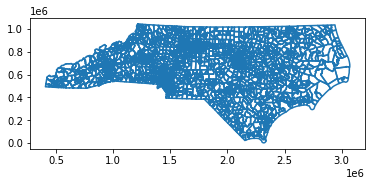

In [5]:
vest_shp.boundary.plot()

# Election Results

## Load in Election Results

Downloaded SOS Election Results using the same file linked by VEST. 

In [6]:
election_results = pd.read_csv('./raw-from-source/SOS/results_pct_20161108/results_pct_20161108.txt', sep='\t', lineterminator='\n')

In [7]:
election_results.head(1)

,County,Election Date,Precinct,Contest Group ID,Contest Type,Contest Name,Choice,Choice Party,Vote For,Election Day,One Stop,Absentee by Mail,Provisional,Total Votes,\r
0,ALAMANCE,11/08/2016,05,1385,S,US HOUSE OF REPRESENTATIVES DISTRICT 6,B. Mark Walker,REP,1,705,685,65,9,1464,\r


In [8]:
#Load in the nationwide FIPS file
fips_file = pd.read_csv("./raw-from-source/FIPS/US_FIPS_Codes.csv")
fips_file = fips_file[fips_file["State"]=="North Carolina"]
fips_file["FIPS County"]=fips_file["FIPS County"].astype(str)

#Make the FIPS three digits
fips_file["FIPS County"]=fips_file["FIPS County"].str.zfill(3)

#Make FIPS County Name uppercase
fips_file['County Name']=fips_file['County Name'].str.upper()

#Create the dictionary
nc_fips_dict = dict(zip(fips_file["County Name"],fips_file["FIPS County"]))
#Create list of fips codes
fips_file["unique_ID"] =  "37" + fips_file["FIPS County"]
fips_codes = fips_file["unique_ID"].tolist()

In [9]:
#Create a list of candidates from the VEST documentation

# List of candidates names from VEST documentation
office_list = ['Donald J. Trump','Hillary Clinton','Gary Johnson','Richard Burr','Deborah K. Ross','Sean Haugh','Pat McCrory',
        'Roy Cooper','Lon Cecil','Dan Forest','Linda Coleman','Jacki Cole','Buck Newton','Josh Stein','Dale R. Folwell',
        'Dan Blue III','Michael LaPaglia','Elaine Marshall','Chuck Stuber','Beth A. Wood','Steve Troxler','Walter Smith',
        'Mike Causey','Wayne Goodwin','Cherie Berry','Charles Meeker','Mark Johnson','June Atkinson','Robert H. (Bob) Edmunds',
        'Michael R. (Mike) Morgan','Richard Dietz','Vince Rozier','Hunter Murphy','Margaret Eagles','Donald Ray Buie','Bob Hunter',
        'Abe Jones','Phil Berger, Jr.','Linda Stephens','Valerie Zachary','Rickye McKoy-Mitchell']
office_list = sorted(office_list)

In [10]:
# Based on VEST documentation, the are write-in candidates for President and the Commissioner of Labor

# Print out possible contest names
opts = ['PRESIDENT','LABOR']
contests_write_in = []
for i in election_results['Contest Name']:
    for j in opts:
        if j in i:
            contests_write_in.append (i)
contests_write_in = set(contests_write_in)
print(contests_write_in)

{'NC COMMISSIONER OF LABOR', 'US PRESIDENT'}


In [11]:
#Create a list of races for write-ins
write_in_contests = ['US PRESIDENT','NC COMMISSIONER OF LABOR']

#Subset the data by the candidates and the write-in races
election_results = election_results[election_results['Choice'].isin(office_list) | election_results['Contest Name'].isin(write_in_contests)]

#Change write-in choice for presidential race
election_results.loc[(election_results['Contest Name'] == 'US PRESIDENT') & (election_results['Choice'] == 'Write-In (Miscellaneous)'), 'Choice'] = 'Write-In (Pres)'

election_results[election_results['Contest Name']=='US PRESIDENT'].head(1)

,County,Election Date,Precinct,Contest Group ID,Contest Type,Contest Name,Choice,Choice Party,Vote For,Election Day,One Stop,Absentee by Mail,Provisional,Total Votes,\r
604,AVERY,11/08/2016,ONE STOP,1001,S,US PRESIDENT,Donald J. Trump,REP,1,0,2110,0,0,2110,\r


In [12]:
election_results["Choice"].unique()

array(['Michael R. (Mike) Morgan', 'Robert H. (Bob) Edmunds',
       'Dan Forest', 'Jacki Cole', 'Linda Coleman', 'Donald Ray Buie',
       'Hunter Murphy', 'Margaret Eagles', 'Donald J. Trump',
       'Gary Johnson', 'Hillary Clinton', 'Jill Stein (Write-In)',
       'Write-In (Pres)', 'Deborah K. Ross', 'Richard Burr', 'Sean Haugh',
       'Lon Cecil', 'Pat McCrory', 'Roy Cooper', 'Elaine Marshall',
       'Michael LaPaglia', 'Beth A. Wood', 'Chuck Stuber',
       'Dale R. Folwell', 'Dan Blue III', 'June Atkinson', 'Mark Johnson',
       'Buck Newton', 'Josh Stein', 'Linda Stephens', 'Phil Berger, Jr.',
       'Richard Dietz', 'Vince Rozier', 'Rickye McKoy-Mitchell',
       'Valerie Zachary', 'Abe Jones', 'Bob Hunter', 'Steve Troxler',
       'Walter Smith', 'Brian (BK) Wayne (Write-In)', 'Charles Meeker',
       'Cherie Berry', 'Write-In (Miscellaneous)', 'Mike Causey',
       'Wayne Goodwin', 'JIll Stein (Write-In)'], dtype=object)

In [13]:
#Add FIPS columns
election_results["COUNTYFP10"] = election_results["County"].map(nc_fips_dict).fillna(election_results["County"])
vest_shp["COUNTYFP10"] = vest_shp['COUNTY_NAM'].map(nc_fips_dict).fillna(vest_shp['COUNTY_NAM'])

In [14]:
#Clean up precinct column by stripping the white space
election_results["Precinct"]=election_results["Precinct"].str.strip()

#Create a column to pivot table by concatenation the FIPS and precinct columns
election_results["pivot_col"]=election_results["COUNTYFP10"]+election_results["Precinct"]

In [15]:
#Run the pivot
pivoted_election_results = pd.pivot_table(election_results,values=["Total Votes"],index=["pivot_col"],columns=["Choice"],aggfunc=sum)

#Fill in N/A with 0
pivoted_election_results = pivoted_election_results.fillna(0)

#Clean the columns
pivoted_election_results.reset_index(drop=False,inplace=True)
pivoted_election_results.columns = pivoted_election_results.columns.droplevel(0)

In [16]:
pivoted_election_results.head(1)

Choice,,Abe Jones,Beth A. Wood,Bob Hunter,Brian (BK) Wayne (Write-In),Buck Newton,Charles Meeker,Cherie Berry,Chuck Stuber,Dale R. Folwell,Dan Blue III,Dan Forest,Deborah K. Ross,Donald J. Trump,Donald Ray Buie,Elaine Marshall,Gary Johnson,Hillary Clinton,Hunter Murphy,JIll Stein (Write-In),Jacki Cole,Jill Stein (Write-In),Josh Stein,June Atkinson,Linda Coleman,Linda Stephens,Lon Cecil,Margaret Eagles,Mark Johnson,Michael LaPaglia,Michael R. (Mike) Morgan,Mike Causey,Pat McCrory,"Phil Berger, Jr.",Richard Burr,Richard Dietz,Rickye McKoy-Mitchell,Robert H. (Bob) Edmunds,Roy Cooper,Sean Haugh,Steve Troxler,Valerie Zachary,Vince Rozier,Walter Smith,Wayne Goodwin,Write-In (Miscellaneous),Write-In (Pres)
0,00101,421.0,534.0,1833.0,1.0,1784.0,392.0,1901.0,1748.0,1803.0,467.0,1839.0,418.0,1865.0,123.0,554.0,50.0,411.0,1721.0,0.0,60.0,10.0,519.0,487.0,422.0,506.0,45.0,406.0,1790.0,1718.0,888.0,1795.0,1806.0,1756.0,1829.0,1826.0,432.0,1161.0,499.0,89.0,1935.0,1813.0,429.0,379.0,487.0,0.0,15.0


In [17]:
pivoted_election_results.rename(columns={ pivoted_election_results.columns[0]: "join_col" }, inplace = True)
pivoted_election_results.columns = pivoted_election_results.columns.get_level_values(0)

In [18]:
#Add FIPS State and County columns
pivoted_election_results.insert(loc=0, column='STATEFP10', value='34')
pivoted_election_results.insert(loc=1, column='COUNTYFP10', value=pivoted_election_results['join_col'].str[0:3])
pivoted_election_results.insert(loc=3, column='Precinct', value=pivoted_election_results['join_col'].str[3:])

In [19]:
pivoted_election_results.head(1)

Choice,STATEFP10,COUNTYFP10,join_col,Precinct,Abe Jones,Beth A. Wood,Bob Hunter,Brian (BK) Wayne (Write-In),Buck Newton,Charles Meeker,Cherie Berry,Chuck Stuber,Dale R. Folwell,Dan Blue III,Dan Forest,Deborah K. Ross,Donald J. Trump,Donald Ray Buie,Elaine Marshall,Gary Johnson,Hillary Clinton,Hunter Murphy,JIll Stein (Write-In),Jacki Cole,Jill Stein (Write-In),Josh Stein,June Atkinson,Linda Coleman,Linda Stephens,Lon Cecil,Margaret Eagles,Mark Johnson,Michael LaPaglia,Michael R. (Mike) Morgan,Mike Causey,Pat McCrory,"Phil Berger, Jr.",Richard Burr,Richard Dietz,Rickye McKoy-Mitchell,Robert H. (Bob) Edmunds,Roy Cooper,Sean Haugh,Steve Troxler,Valerie Zachary,Vince Rozier,Walter Smith,Wayne Goodwin,Write-In (Miscellaneous),Write-In (Pres)
0,34,001,00101,01,421.0,534.0,1833.0,1.0,1784.0,392.0,1901.0,1748.0,1803.0,467.0,1839.0,418.0,1865.0,123.0,554.0,50.0,411.0,1721.0,0.0,60.0,10.0,519.0,487.0,422.0,506.0,45.0,406.0,1790.0,1718.0,888.0,1795.0,1806.0,1756.0,1829.0,1826.0,432.0,1161.0,499.0,89.0,1935.0,1813.0,429.0,379.0,487.0,0.0,15.0


In [20]:
#Combine all presidential write-in columns
pivoted_election_results['G16PREOWRI'] = pivoted_election_results['JIll Stein (Write-In)'] + pivoted_election_results['Jill Stein (Write-In)'] + pivoted_election_results['Write-In (Pres)']
pivoted_election_results = pivoted_election_results.drop(['JIll Stein (Write-In)', 'Jill Stein (Write-In)','Write-In (Pres)'], axis=1)

#Combine all labor write-in columns
pivoted_election_results['G16LABOWRI'] = pivoted_election_results['Brian (BK) Wayne (Write-In)'] + pivoted_election_results['Write-In (Miscellaneous)']
pivoted_election_results = pivoted_election_results.drop(['Brian (BK) Wayne (Write-In)', 'Write-In (Miscellaneous)'], axis=1)

pivoted_election_results.head(1)

Choice,STATEFP10,COUNTYFP10,join_col,Precinct,Abe Jones,Beth A. Wood,Bob Hunter,Buck Newton,Charles Meeker,Cherie Berry,Chuck Stuber,Dale R. Folwell,Dan Blue III,Dan Forest,Deborah K. Ross,Donald J. Trump,Donald Ray Buie,Elaine Marshall,Gary Johnson,Hillary Clinton,Hunter Murphy,Jacki Cole,Josh Stein,June Atkinson,Linda Coleman,Linda Stephens,Lon Cecil,Margaret Eagles,Mark Johnson,Michael LaPaglia,Michael R. (Mike) Morgan,Mike Causey,Pat McCrory,"Phil Berger, Jr.",Richard Burr,Richard Dietz,Rickye McKoy-Mitchell,Robert H. (Bob) Edmunds,Roy Cooper,Sean Haugh,Steve Troxler,Valerie Zachary,Vince Rozier,Walter Smith,Wayne Goodwin,G16PREOWRI,G16LABOWRI
0,34,001,00101,01,421.0,534.0,1833.0,1784.0,392.0,1901.0,1748.0,1803.0,467.0,1839.0,418.0,1865.0,123.0,554.0,50.0,411.0,1721.0,60.0,519.0,487.0,422.0,506.0,45.0,406.0,1790.0,1718.0,888.0,1795.0,1806.0,1756.0,1829.0,1826.0,432.0,1161.0,499.0,89.0,1935.0,1813.0,429.0,379.0,487.0,25.0,1.0


In [21]:
pivoted_election_results.columns = ["STATEFP10","COUNTYFP10","join_col","Precinct","G16SACDJON","G16AUDDWOO","G16SACRHUN","G16ATGRNEW","G16LABDMEE","G16LABRBER","G16AUDRSTU","G16TRERFOL","G16TREDBLU","G16LTGRFOR","G16USSDROS","G16PRERTRU","G16SACUBUI","G16SOSDMAR","G16PRELJOH","G16PREDCLI","G16SACRMUR","G16LTGLCOL","G16ATGDSTE","G16SPIDATK","G16LTGDCOL","G16SACDSTE","G16GOVLCEC","G16SACDEAG","G16SPIRJOH","G16SOSRLAP","G16SSCDMOR","G16INSRCAU","G16GOVRMCC","G16SACRBER","G16USSRBUR","G16SACRDIE","G16SACDMCK","G16SSCREDM","G16GOVDCOO","G16USSLHAU","G16AGRRTRO","G16SACRZAC","G16SACDROZ","G16AGRDSMI","G16INSDGOO","G16PREOWRI","G16LABOWRI"]

In [22]:
pivoted_election_results.head(1)

,STATEFP10,COUNTYFP10,join_col,Precinct,G16SACDJON,G16AUDDWOO,G16SACRHUN,G16ATGRNEW,G16LABDMEE,G16LABRBER,G16AUDRSTU,G16TRERFOL,G16TREDBLU,G16LTGRFOR,G16USSDROS,G16PRERTRU,G16SACUBUI,G16SOSDMAR,G16PRELJOH,G16PREDCLI,G16SACRMUR,G16LTGLCOL,G16ATGDSTE,G16SPIDATK,G16LTGDCOL,G16SACDSTE,G16GOVLCEC,G16SACDEAG,G16SPIRJOH,G16SOSRLAP,G16SSCDMOR,G16INSRCAU,G16GOVRMCC,G16SACRBER,G16USSRBUR,G16SACRDIE,G16SACDMCK,G16SSCREDM,G16GOVDCOO,G16USSLHAU,G16AGRRTRO,G16SACRZAC,G16SACDROZ,G16AGRDSMI,G16INSDGOO,G16PREOWRI,G16LABOWRI
0,34,001,00101,01,421.0,534.0,1833.0,1784.0,392.0,1901.0,1748.0,1803.0,467.0,1839.0,418.0,1865.0,123.0,554.0,50.0,411.0,1721.0,60.0,519.0,487.0,422.0,506.0,45.0,406.0,1790.0,1718.0,888.0,1795.0,1806.0,1756.0,1829.0,1826.0,432.0,1161.0,499.0,89.0,1935.0,1813.0,429.0,379.0,487.0,25.0,1.0


In [23]:
election_results = pivoted_election_results.copy()

## Compare vote totals before allocation

In [24]:
races = [x for x in vest_shp.columns if 'G16' in x]
races

['G16PRERTRU',
 'G16PREDCLI',
 'G16PRELJOH',
 'G16PREOWRI',
 'G16USSRBUR',
 'G16USSDROS',
 'G16USSLHAU',
 'G16GOVRMCC',
 'G16GOVDCOO',
 'G16GOVLCEC',
 'G16LTGRFOR',
 'G16LTGDCOL',
 'G16LTGLCOL',
 'G16ATGRNEW',
 'G16ATGDSTE',
 'G16TRERFOL',
 'G16TREDBLU',
 'G16SOSRLAP',
 'G16SOSDMAR',
 'G16AUDRSTU',
 'G16AUDDWOO',
 'G16AGRRTRO',
 'G16AGRDSMI',
 'G16INSRCAU',
 'G16INSDGOO',
 'G16LABRBER',
 'G16LABDMEE',
 'G16LABOWRI',
 'G16SPIRJOH',
 'G16SPIDATK',
 'G16SSCREDM',
 'G16SSCDMOR',
 'G16SACRDIE',
 'G16SACDROZ',
 'G16SACRMUR',
 'G16SACDEAG',
 'G16SACUBUI',
 'G16SACRHUN',
 'G16SACDJON',
 'G16SACRBER',
 'G16SACDSTE',
 'G16SACRZAC',
 'G16SACDMCK']

In [25]:
sum_var_1 = 0
sum_var_2 = 0
for i in races:
    sum_var_1 += np.sum(vest_shp[i])
    sum_var_2 += np.sum(election_results[i])
print(sum_var_1)
print(sum_var_2)

81049802
81049802.0


In [26]:
def allocate_absentee(df_receiving_votes,df_allocating,column_list,col_allocating):
    original_cols = list(df_receiving_votes.columns)
    
    #Add in the "Total Votes column"
    df_receiving_votes.loc[:,"Total_Votes"]=0
    for race in column_list:
        df_receiving_votes.loc[:,"Total_Votes"]+=df_receiving_votes.loc[:,race]
    
    #Create the needed dataframes
    precinct_specific_totals = pd.DataFrame(df_receiving_votes.groupby([col_allocating]).sum())
    precinct_specific_totals.reset_index(drop=False,inplace=True)
    to_dole_out_totals = pd.DataFrame(df_allocating.groupby([col_allocating]).sum())
    to_dole_out_totals.reset_index(drop=False,inplace=True)
    
    #Print out any instances where the allocation, as written, won't work
    special_allocation_needed = []
    for index, row in precinct_specific_totals.iterrows():
        for race in column_list:
            if (row[race]==0):
                race_district = row[col_allocating]
                if race_district in to_dole_out_totals[col_allocating].unique():
                    to_allocate = int(to_dole_out_totals.loc[to_dole_out_totals[col_allocating]==race_district][race])
                    if (to_allocate != 0):
                        special_allocation_needed.append([race_district,race])
    
    #Create some new columns for each of these races to deal with the allocation
    for race in column_list:
        add_var = race+"_add"
        rem_var = race+"_rem"
        floor_var = race+"_floor"
        df_receiving_votes.loc[:,add_var]=0.0
        df_receiving_votes.loc[:,rem_var]=0.0
        df_receiving_votes.loc[:,floor_var]=0.0

    #Iterate over the rows
    #Note this function iterates over the dataframe two times so the rounded vote totals match the totals to allocate
    for index, row in df_receiving_votes.iterrows():
        if row[col_allocating] in to_dole_out_totals[col_allocating].unique():
            for race in column_list:
                add_var = race+"_add"
                rem_var = race+"_rem"
                floor_var = race+"_floor"
                #Grab the district
                county_id = row[col_allocating]
                if [county_id,race] in special_allocation_needed:
                    #Get the denominator for the allocation - the summed "total votes" for precincts in that grouping
                    denom = precinct_specific_totals.loc[precinct_specific_totals[col_allocating]==county_id]["Total_Votes"]
                    #Get one of the numerators, how many districtwide votes to allocate
                    numer = to_dole_out_totals.loc[to_dole_out_totals[col_allocating]==county_id][race]
                    #Get the "total votes" for this particular precinct
                    val = df_receiving_votes.at[index,"Total_Votes"]
                    #Get the vote share, the precincts % of total precinct votes in the district times votes to allocate
                else:
                    #Get the denominator for the allocation (the precinct vote totals)
                    denom = precinct_specific_totals.loc[precinct_specific_totals[col_allocating]==county_id][race]
                    #Get one of the numerators, how many districtwide votes to allocate
                    numer = to_dole_out_totals.loc[to_dole_out_totals[col_allocating]==county_id][race]
                    #Get the vote totals for this race in this precinct
                    val = df_receiving_votes.at[index,race]
                    #Get the vote share, the precincts % of total precinct votes in the district times votes to allocate
                if ((float(denom)==0)):
                    vote_share = 0
                else:
                    vote_share = (float(val)/float(denom))*float(numer)
                df_receiving_votes.at[index,add_var] = vote_share
                #Take the decimal remainder of the allocation
                df_receiving_votes.at[index,rem_var] = vote_share%1
                #Take the floor of the allocation
                df_receiving_votes.at[index,floor_var] = np.floor(vote_share)

    #After the first pass through, get the sums of the races by district to assist in the rounding            
    first_allocation = pd.DataFrame(df_receiving_votes.groupby([col_allocating]).sum())

    #Now we want to iterate district by district to work on rounding
    county_list = list(to_dole_out_totals[col_allocating].unique()) 

    #Iterate over the district
    for county in county_list:
        for race in column_list:
            add_var = race+"_add"
            rem_var = race+"_rem"
            floor_var = race+"_floor"
            #County how many votes still need to be allocated (because we took the floor of all the initial allocations)
            to_go = int(np.round((int(to_dole_out_totals.loc[to_dole_out_totals[col_allocating]==county][race])-first_allocation.loc[first_allocation.index==county,floor_var])))
            #Grab the n precincts with the highest remainders and round these up, where n is the # of votes that still need to be allocated
            for index in df_receiving_votes.loc[df_receiving_votes[col_allocating]==county][rem_var].nlargest(to_go).index:
                df_receiving_votes.at[index,add_var] = np.ceil(df_receiving_votes.at[index,add_var])

    #Iterate over every race again
    for race in column_list:
        add_var = race+"_add"
        #Round every allocation down to not add fractional votes
        df_receiving_votes.loc[:,add_var]=np.floor(df_receiving_votes.loc[:,add_var])
        df_receiving_votes.loc[:,race]+=df_receiving_votes.loc[:,add_var]
        
    df_receiving_votes = df_receiving_votes[original_cols]
    
    return df_receiving_votes

In [27]:
searchfor = ['ABS', 'PROVISIONAL','ONE STOP','CURBSIDE','TRANS','OS ','OS-',' OS','PROVISIOINAL','OSAP','OSCA','OSCH','OSKD','OSLL','OSLOB','OSNR','OSOP','OSTA','OSWA','PROVI ','ONE-STOP ','OSAB ','OSAV ','OSCB ','OSFV ','OSGR ','OSHS ','OSNB ','OSTC ','OSWD ','OSZB ','OSFB ','OSBOE','OSHOS']
in_sos =  election_results[election_results["Precinct"].str.contains('|'.join(searchfor))]
in_sos = in_sos.groupby(by=["COUNTYFP10"]).sum().reset_index()
in_sos


,COUNTYFP10,G16SACDJON,G16AUDDWOO,G16SACRHUN,G16ATGRNEW,G16LABDMEE,G16LABRBER,G16AUDRSTU,G16TRERFOL,G16TREDBLU,G16LTGRFOR,G16USSDROS,G16PRERTRU,G16SACUBUI,G16SOSDMAR,G16PRELJOH,G16PREDCLI,G16SACRMUR,G16LTGLCOL,G16ATGDSTE,G16SPIDATK,G16LTGDCOL,G16SACDSTE,G16GOVLCEC,G16SACDEAG,G16SPIRJOH,G16SOSRLAP,G16SSCDMOR,G16INSRCAU,G16GOVRMCC,G16SACRBER,G16USSRBUR,G16SACRDIE,G16SACDMCK,G16SSCREDM,G16GOVDCOO,G16USSLHAU,G16AGRRTRO,G16SACRZAC,G16SACDROZ,G16AGRDSMI,G16INSDGOO,G16PREOWRI,G16LABOWRI
0,005,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,007,3783.0,4127.0,2019.0,1868.0,3848.0,2118.0,1787.0,1869.0,4084.0,2103.0,3855.0,2129.0,195.0,4273.0,61.0,3929.0,1771.0,74.0,4143.0,4023.0,3865.0,3953.0,54.0,3833.0,1933.0,1674.0,3805.0,1676.0,2140.0,1836.0,2101.0,1929.0,3850.0,1639.0,3902.0,119.0,2077.0,1911.0,3837.0,3892.0,4297.0,21.0,5.0
2,009,2192.0,2624.0,4614.0,4391.0,2181.0,4789.0,4234.0,4500.0,2374.0,4698.0,2218.0,4795.0,420.0,2902.0,167.0,2244.0,4205.0,174.0,2665.0,2477.0,2278.0,2453.0,149.0,2207.0,4473.0,4052.0,2833.0,4289.0,4559.0,4396.0,4783.0,4508.0,2235.0,3358.0,2603.0,264.0,4756.0,4533.0,2258.0,2237.0,2607.0,98.0,7.0
3,011,788.0,942.0,2259.0,2229.0,787.0,2365.0,2162.0,2249.0,862.0,2367.0,866.0,2409.0,142.0,1027.0,56.0,872.0,2136.0,66.0,966.0,936.0,820.0,881.0,68.0,787.0,2212.0,2125.0,1268.0,2227.0,2293.0,2186.0,2339.0,2226.0,804.0,1268.0,978.0,100.0,2373.0,2209.0,803.0,794.0,913.0,36.0,4.0
4,013,5434.0,6279.0,8724.0,8413.0,5625.0,8734.0,8015.0,8537.0,5785.0,8609.0,5602.0,8868.0,593.0,6621.0,212.0,5855.0,8019.0,259.0,6113.0,6175.0,5785.0,5929.0,178.0,5553.0,8216.0,7795.0,6253.0,8309.0,8802.0,8260.0,8732.0,8540.0,5520.0,6760.0,5958.0,491.0,8869.0,8538.0,5552.0,5589.0,6021.0,109.0,24.0
5,015,3359.0,3602.0,1776.0,1799.0,3474.0,1788.0,1649.0,1759.0,3503.0,1853.0,3423.0,1964.0,98.0,3726.0,32.0,3562.0,1659.0,44.0,3532.0,3620.0,3507.0,3488.0,25.0,3376.0,1665.0,1562.0,2846.0,1652.0,2080.0,1690.0,1977.0,1698.0,3368.0,1531.0,3420.0,88.0,1906.0,1716.0,3372.0,3450.0,3629.0,28.0,8.0
6,017,4812.0,5352.0,4941.0,4865.0,4901.0,5157.0,4636.0,4900.0,5089.0,5188.0,4796.0,5657.0,446.0,5757.0,121.0,4840.0,4540.0,172.0,5360.0,5398.0,4914.0,5120.0,105.0,4801.0,4690.0,4301.0,5680.0,4735.0,5501.0,4694.0,5457.0,4337.0,4858.0,3505.0,4982.0,235.0,5232.0,4785.0,5533.0,5000.0,5328.0,45.0,20.0
7,019,1171.0,1385.0,2109.0,2071.0,1251.0,2185.0,2034.0,2157.0,1272.0,2149.0,1327.0,2168.0,176.0,1445.0,80.0,1441.0,1934.0,75.0,1430.0,1364.0,1318.0,1337.0,76.0,1196.0,2059.0,2016.0,1486.0,2138.0,2136.0,1968.0,2168.0,2083.0,1158.0,1398.0,1439.0,151.0,2166.0,2123.0,1237.0,1259.0,1302.0,42.0,2.0
8,021,53703.0,59422.0,40243.0,36066.0,55127.0,40616.0,36232.0,37792.0,57269.0,36622.0,58166.0,37580.0,5407.0,61581.0,2468.0,58178.0,34455.0,3443.0,61085.0,59063.0,57758.0,58819.0,2510.0,54329.0,36284.0,34549.0,53874.0,36370.0,35123.0,35286.0,37781.0,38060.0,55270.0,30394.0,62092.0,3376.0,41044.0,38003.0,55566.0,55006.0,58825.0,2077.0,92.0
9,023,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [28]:
election_results = election_results[~election_results["Precinct"].str.contains('|'.join(searchfor))]
election_results = allocate_absentee(election_results,in_sos,races,'COUNTYFP10')
print('Done')

Done


## Compare Election Result Totals

### Compare Vote Totals

In [29]:
sum_var_1 = 0
sum_var_2 = 0
for i in races:
    sum_var_1 += np.sum(vest_shp[i])
    sum_var_2 += np.sum(election_results[i])
print(sum_var_1)
print(sum_var_2)

81049802
81049802.0


### Compare Race Totals

In [30]:
def statewide_totals_check(partner_df,source_df,column_list):
    print("***Statewide Totals Check***")
    for race in column_list:
        if (sum(partner_df[race])- source_df[race].sum() != 0):
            print(race+" has a difference of "+str(sum(partner_df[race])-source_df[race].sum())+" votes")
            print("\tVEST: "+str(sum(partner_df[race]))+" votes")
            print("\tSOURCES: "+str(source_df[race].sum())+" votes")
        else:
            print(race + " is equal", "\tVEST / RDH: " + str(sum(partner_df[race])))

In [31]:
statewide_totals_check(vest_shp,election_results,races)

***Statewide Totals Check***
G16PRERTRU is equal 	VEST / RDH: 2362631
G16PREDCLI is equal 	VEST / RDH: 2189316
G16PRELJOH is equal 	VEST / RDH: 130126
G16PREOWRI is equal 	VEST / RDH: 59491
G16USSRBUR is equal 	VEST / RDH: 2395376
G16USSDROS is equal 	VEST / RDH: 2128165
G16USSLHAU is equal 	VEST / RDH: 167592
G16GOVRMCC is equal 	VEST / RDH: 2298880
G16GOVDCOO is equal 	VEST / RDH: 2309157
G16GOVLCEC is equal 	VEST / RDH: 102977
G16LTGRFOR is equal 	VEST / RDH: 2393514
G16LTGDCOL is equal 	VEST / RDH: 2093375
G16LTGLCOL is equal 	VEST / RDH: 132645
G16ATGRNEW is equal 	VEST / RDH: 2279006
G16ATGDSTE is equal 	VEST / RDH: 2303619
G16TRERFOL is equal 	VEST / RDH: 2373022
G16TREDBLU is equal 	VEST / RDH: 2129762
G16SOSRLAP is equal 	VEST / RDH: 2163185
G16SOSDMAR is equal 	VEST / RDH: 2368091
G16AUDRSTU is equal 	VEST / RDH: 2253394
G16AUDDWOO is equal 	VEST / RDH: 2259436
G16AGRRTRO is equal 	VEST / RDH: 2524445
G16AGRDSMI is equal 	VEST / RDH: 2018872
G16INSRCAU is equal 	VEST / RDH: 2

## Differences in State Totals 
VEST State totals match official state totals. Our totals are off because of what appears to be an error in the North Carolina "Precinct Sorted Results". In counties where VEST used these files we did as well and the totals do not appear to match.  We assume that VEST did some deallocation that we were not able to do.

### Compare County Totals

In [32]:
def county_totals_check(partner_df,source_df,column_list,county_col,full_print=False):
    print("***Countywide Totals Check***")
    print("")
    diff_counties=[]
    for race in column_list:
        diff = partner_df.groupby([county_col]).sum()[race]-source_df.groupby([county_col]).sum()[race]
        for val in diff[diff != 0].index.values.tolist():
            if val not in diff_counties:
                diff_counties.append(val)
        if len(diff[diff != 0]!=0):   
            print(race + " contains differences in these counties:")
            for val in diff[diff != 0].index.values.tolist():
                county_differences = diff[diff != 0]
                print("\t"+val+" has a difference of "+str(county_differences[val])+" votes")
                print("\t\tVEST: "+str(partner_df.groupby([county_col]).sum().loc[val,race])+" votes")
                print("\t\tSOURCES: "+str(source_df.groupby([county_col]).sum().loc[val,race])+" votes")
            if (full_print):
                for val in diff[diff == 0].index.values.tolist():
                    county_similarities = diff[diff == 0]
                    print("\t"+val + ": "+ str(partner_df.groupby([county_col]).sum().loc[val,race])+" votes")
        else:
            print(race + " is equal across all counties")
            if (full_print):
                for val in diff[diff == 0].index.values.tolist():
                    county_similarities = diff[diff == 0]
                    print("\t"+val + ": "+ str(partner_df.groupby([county_col]).sum().loc[val,race])+" votes")

In [33]:
county_totals_check(vest_shp,election_results,races,'COUNTYFP10')

***Countywide Totals Check***

G16PRERTRU is equal across all counties
G16PREDCLI is equal across all counties
G16PRELJOH is equal across all counties
G16PREOWRI is equal across all counties
G16USSRBUR is equal across all counties
G16USSDROS is equal across all counties
G16USSLHAU is equal across all counties
G16GOVRMCC is equal across all counties
G16GOVDCOO is equal across all counties
G16GOVLCEC is equal across all counties
G16LTGRFOR is equal across all counties
G16LTGDCOL is equal across all counties
G16LTGLCOL is equal across all counties
G16ATGRNEW is equal across all counties
G16ATGDSTE is equal across all counties
G16TRERFOL is equal across all counties
G16TREDBLU is equal across all counties
G16SOSRLAP is equal across all counties
G16SOSDMAR is equal across all counties
G16AUDRSTU is equal across all counties
G16AUDDWOO is equal across all counties
G16AGRRTRO is equal across all counties
G16AGRDSMI is equal across all counties
G16INSRCAU is equal across all counties
G16INSDGO

## Vote differences in Counties

Most of the vote differences are most likely due to the precinct-sorted data from counties. Counties that were not listed by VEST but have vote differences are Guilford, Hertford, McDowell, Madison, and Pasquotank.

## Attempt to Join

In [34]:
#Add join columns to both
vest_shp["join_col"]=vest_shp['COUNTYFP10']+vest_shp['PREC_ID']

In [35]:
#Check to make sure that the join_col in both files is unique

print(len(election_results["join_col"]))
print(election_results["join_col"].value_counts().sum())

print(len(vest_shp["join_col"]))
print(vest_shp["join_col"].value_counts().sum())

2704
2704
2704
2704


In [36]:
#Uppercase both join columns
election_results['join_col'] = election_results['join_col'].str.upper()
vest_shp['join_col'] = vest_shp['join_col'].str.upper()
#Strip white space
election_results['join_col']=election_results['join_col'].str.strip()
vest_shp['join_col']=vest_shp['join_col'].str.strip()

In [37]:
data_columns = races
empty_precincts = []
for index, row in vest_shp.iterrows():
    number_of_zero_vote_races = 0
    for race in data_columns:
        if (row[race]==0):
            number_of_zero_vote_races += 1
    if(number_of_zero_vote_races == len(data_columns)):
        empty_precincts.append(row["PREC_ID"])
print(len(empty_precincts))

0


In [38]:
data_columns = races
empty_precincts = []
for index, row in election_results.iterrows():
    number_of_zero_vote_races = 0
    for race in data_columns:
        if (row[race]==0):
            number_of_zero_vote_races += 1
    if(number_of_zero_vote_races == len(data_columns)):
        empty_precincts.append(row["Precinct"])
print(len(empty_precincts))

0


## Attempt Join

In [39]:
join_attempt_one = pd.merge(election_results,vest_shp,how="outer",on="join_col",indicator=True)
print(join_attempt_one["_merge"].value_counts())

both          2704
left_only        0
right_only       0
Name: _merge, dtype: int64


In [40]:
join_attempt_one[join_attempt_one['_merge'] != 'both'][['COUNTYFP10_x','Precinct','COUNTYFP10_y','PREC_ID','join_col']]

,COUNTYFP10_x,Precinct,COUNTYFP10_y,PREC_ID,join_col


## Join Attempt 2

In [41]:
join_attempt_two = pd.merge(election_results,vest_shp,how="outer",on="join_col",indicator=True)
print(join_attempt_two["_merge"].value_counts())

both          2704
left_only        0
right_only       0
Name: _merge, dtype: int64


### Compare Precinct Votes

In [42]:
def precinct_votes_check(merged_df,column_list,vest_on_left,name_col,print_level=0):
    merged_df = merged_df.sort_values(by=[name_col],inplace=False)
    matching_rows = 0
    different_rows = 0
    diff_list=[]
    diff_values = []
    max_diff = 0
    for index,row in merged_df.iterrows():
        same = True
        for i in column_list:
            left_data = i + "_x"
            right_data = i + "_y"
            if ((row[left_data] is None) or (row[right_data] is None) or (np.isnan(row[right_data])or(np.isnan(row[left_data])))):
                print("FIX NaN value at: ", row[name_col])
                return;
            diff = abs(row[left_data]-row[right_data])
            if (diff>0):
                same = False
                diff_values.append(abs(diff))
                if (diff>max_diff):
                    max_diff = diff
            if(diff>print_level):
                if (vest_on_left):
                    print(i, "{:.>72}".format(row[name_col]), "(V)","{:.>5}".format(int(row[left_data]))," (S){:.>5}".format(int(row[right_data])),"(D):{:>5}".format(int(row[left_data]-row[right_data])))                           
                else:
                    print(i, "{:.>72}".format(row[name_col]), "(S)","{:.>5}".format(int(row[left_data]))," (V){:.>5}".format(int(row[right_data])),"(D):{:>5}".format(int(row[left_data]-row[right_data])))
        if(same != True):
            different_rows +=1
            diff_list.append(row[name_col])
        else:
            matching_rows +=1
    print("")
    print("There are ", len(merged_df.index)," total rows")
    print(different_rows," of these rows have election result differences")
    print(matching_rows," of these rows are the same")
    print("")
    print("The max difference between any one shared column in a row is: ", max_diff)
    if(len(diff_values)!=0):
        print("The average difference is: ", str(sum(diff_values)/len(diff_values)))
    count_big_diff = len([i for i in diff_values if i > 10])
    print("There are ", str(count_big_diff), "precinct results with a difference greater than 10")
    print("")
    print("All precincts containing differences:")
    diff_list.sort()
    print(diff_list)

In [43]:
precinct_votes_check(join_attempt_two[join_attempt_two["_merge"]=="both"],races,False,'PREC_ID')

G16PRERTRU .....................................................................001 (S) ..418  (V)..451 (D):  -33
G16PREDCLI .....................................................................001 (S) ..692  (V)..725 (D):  -33
G16PRELJOH .....................................................................001 (S) ...51  (V)...54 (D):   -3
G16USSRBUR .....................................................................001 (S) ..575  (V)..611 (D):  -36
G16USSDROS .....................................................................001 (S) ..589  (V)..618 (D):  -29
G16USSLHAU .....................................................................001 (S) ...28  (V)...31 (D):   -3
G16GOVRMCC .....................................................................001 (S) ..473  (V)..512 (D):  -39
G16GOVDCOO .....................................................................001 (S) ..698  (V)..727 (D):  -29
G16GOVLCEC .....................................................................001 (S) 

## Differences in Precinct totals  
  
There are a number of differences in the Precinct Totals. This is most likely due to the fact that VEST used precinct-sorted data for 39 counties.

# Precinct Shapefiles
## Documentation
Precinct shapefiles from the North Carolina State Board of Elections: SBE_PRECINCTS_20170519.zip from  
source-https://dl.ncsbe.gov/?prefix=PrecinctMaps/ https://www.ncsbe.gov/results-data/voting-maps-redistricting

### Precinct Shapefiles

In [44]:
shapefiles_nc = gp.read_file('./raw-from-source/SOS/SBE_PRECINCTS_20161004/Precincts.shp')

In [45]:
vest_shp = vest_shp.to_crs(3857)
shapefiles_nc = shapefiles_nc.to_crs(3857)

In [46]:
shapefiles_nc.head(1)

PREC_ID          ENR_DESC COUNTY_NAM OF_PREC_ID  COUNTY_ID  \
0     06N  06N_NORTH GRAHAM   ALAMANCE       None          1   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                 

<AxesSubplot:>

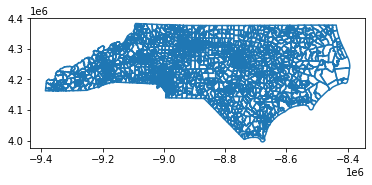

In [47]:
shapefiles_nc.boundary.plot()

In [48]:
print(shapefiles_nc.shape)
vest_shp.shape

(2704, 6)


(2704, 50)

<AxesSubplot:>

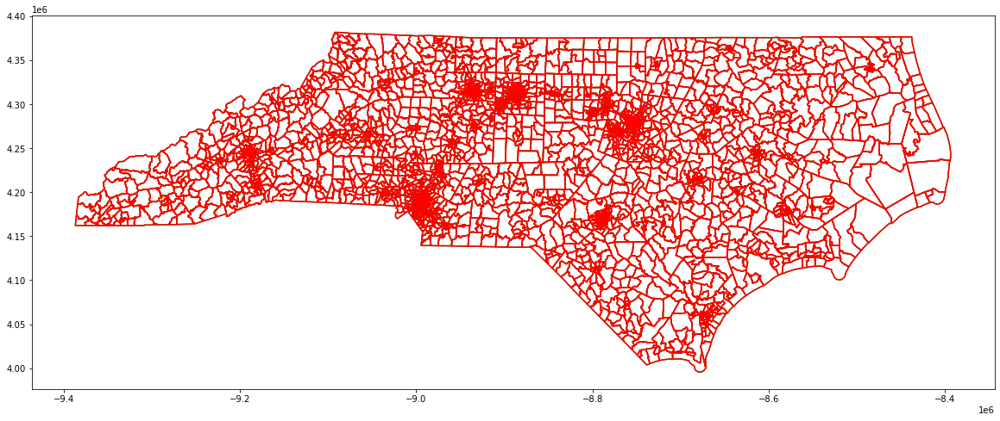

In [49]:
ax = shapefiles_nc.boundary.plot(figsize=(20,20),color="green")
vest_shp.boundary.plot(figsize=(20,20),ax=ax,color="red")

In [50]:
shapefiles_nc["COUNTYFP10"] = shapefiles_nc["COUNTY_NAM"].map(nc_fips_dict).fillna(shapefiles_nc["COUNTY_NAM"])

In [51]:
shapefiles_nc["join_col"]=shapefiles_nc['COUNTYFP10']+shapefiles_nc['PREC_ID']

In [52]:
join_attempt_one = pd.merge(shapefiles_nc,election_results,how="outer",on="join_col",indicator=True)
print(join_attempt_one["_merge"].value_counts())

both          2704
left_only        0
right_only       0
Name: _merge, dtype: int64


In [53]:
join_attempt_one[join_attempt_one['_merge'] != 'both'][['COUNTYFP10_x','PREC_ID','COUNTYFP10_y','Precinct','join_col']]

,COUNTYFP10_x,PREC_ID,COUNTYFP10_y,Precinct,join_col


In [54]:
shapefiles_nc_comp = join_attempt_one[join_attempt_one['_merge'] == 'both']

In [55]:
final_merge = pd.merge(shapefiles_nc_comp,vest_shp,how="outer",on="join_col",indicator="final_merge")
final_merge["final_merge"].value_counts()

both          2704
left_only        0
right_only       0
Name: final_merge, dtype: int64

In [56]:
both = final_merge[final_merge["final_merge"]=="both"]
vest_geoms = gp.GeoDataFrame(both,geometry="geometry_x")
source_geoms = gp.GeoDataFrame(both,geometry="geometry_y")
source_geoms = source_geoms.to_crs(3857)
vest_geoms = vest_geoms.to_crs(3857)
source_geoms["geometry_x"]=source_geoms.buffer(0)
vest_geoms["geometry_y"]=vest_geoms.buffer(0)
vals = source_geoms.geom_almost_equals(vest_geoms,decimal=0)
print(vals.value_counts())

True    2704
dtype: int64


In [57]:
count = 0
area_list = []
for i in range(0,len(source_geoms)):
    diff = source_geoms.iloc[[i]].symmetric_difference(vest_geoms.iloc[[i]])
    intersection = source_geoms.iloc[[i]].intersection(vest_geoms.iloc[[i]])
    area = float(diff.area/10e6)
    area_list.append(area)
    #print("Area is " + str(area))

    if (area > .5):
        count += 1
        name = source_geoms.iat[i,3]
        county = source_geoms.iat[i,1]
        
        print(str(count)+") For " + str(county) + '-' + str(name) + " difference in area is " + str(area))
        if (intersection.iloc[0].is_empty):
            base = diff.plot(color="red")
            source_geoms.iloc[[i]].plot(color="orange",ax=base)
            vest_geoms.iloc[[i]].plot(color="blue",ax=base)
            base.set_title(name)
        else:
            base = diff.plot(color="red")
            source_geoms.iloc[[i]].plot(color="orange",ax=base)
            vest_geoms.iloc[[i]].plot(color="blue",ax=base)
            intersection.plot(color="green",ax=base)
            base.set_title(name)

In [58]:
df = pd.DataFrame(area_list)
print(df.shape)

print(str(len(df[df[0]==0]))+" precincts w/ a difference of 0 km^2")
print(str(len(df[(df[0]<.1) & (df[0]>0)]))+ " precincts w/ a difference between 0 and 0.1 km^2")
print(str(len(df[(df[0]<.5) & (df[0]>=.1)]))+ " precincts w/ a difference between 0.1 and 0.5 km^2")
print(str(len(df[(df[0]<1) & (df[0]>=.5)]))+ " precincts w/ a difference between 0.5 and 1 km^2")
print(str(len(df[(df[0]<2) & (df[0]>=1)]))+ " precincts w/ a difference between 1 and 2 km^2")
print(str(len(df[(df[0]<5) & (df[0]>=2)]))+ " precincts w/ a difference between 2 and 5 km^2")
print(str(len(df[(df[0]>=5)]))+ " precincts w/ a difference greater than 5 km^2")

(2704, 1)
2704 precincts w/ a difference of 0 km^2
0 precincts w/ a difference between 0 and 0.1 km^2
0 precincts w/ a difference between 0.1 and 0.5 km^2
0 precincts w/ a difference between 0.5 and 1 km^2
0 precincts w/ a difference between 1 and 2 km^2
0 precincts w/ a difference between 2 and 5 km^2
0 precincts w/ a difference greater than 5 km^2
